In [1]:
import json
from typing import List

import numpy as np
import pandas as pd
from tqdm.notebook import tqdm
from rich import print
import matplotlib.pyplot as plt

from src.blip_modules.blip_text_encoder import BLIPTextEncoder
from src.blip_modules.blip_img_encoder import BLIPImgEncoder
from src.data_utils import targetpad_transform
from src.cirr_experiment.utils import element_wise_sum_original, get_combing_function_with_alpha, \
    convert_to_pivot_cirr, prepare_and_plot_recall_pivot, prepare_ground_truths, plot_retrieval_results_of_i, \
    found_better_than_original
from src.cirr_experiment.validate_notebook import cirr_val_retrieval_text_image_grid_search, compute_results_cirr_val
from src.utils import device

# <div style="font-family: 'Garamond', serif; font-size: 22px; color: #ffffff; background-color: #34568B; text-align: center; padding: 15px; border-radius: 10px; border: 2px solid #FF6F61; box-shadow: 0 6px 12px rgba(0, 0, 0, 0.3); margin-bottom: 20px;">Step 1: Set up the experiment</div>

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Set up the cache for the experiment</div>

In [2]:
cache = {}

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Same concept as script version here</div>

In [3]:
BLIP_PRETRAINED_PATH = '../../../models/model_large.pth'
MED_CONFIG_PATH = '../../blip_modules/med_config_large.json'

In [4]:
blip_text_encoder = BLIPTextEncoder(
    BLIP_PRETRAINED_PATH, 
    MED_CONFIG_PATH,
    use_pretrained_proj_layer=True,
    vit='large',
)

blip_text_encoder = blip_text_encoder.to(device)
print("blip text encoder loaded.")
blip_text_encoder.eval()

load checkpoint from ../../../models/model_large.pth for text_encoder.
load checkpoint from ../../../models/model_large.pth for text_proj.


blip text encoder loaded.

BLIPTextEncoder(
  (text_encoder): BertModel(
    (embeddings): BertEmbeddings(
      (word_embeddings): Embedding(30524, 768, padding_idx=0)
      (position_embeddings): Embedding(512, 768)
      (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
      (dropout): Dropout(p=0.1, inplace=False)
    )
    (encoder): BertEncoder(
      (layer): ModuleList(
        (0-11): 12 x BertLayer(
          (attention): BertAttention(
            (self): BertSelfAttention(
              (query): Linear(in_features=768, out_features=768, bias=True)
              (key): Linear(in_features=768, out_features=768, bias=True)
              (value): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.1, inplace=False)
            )
            (output): BertSelfOutput(
              (dense): Linear(in_features=768, out_features=768, bias=True)
              (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
              (dropout): Drop

In [5]:
blip_img_encoder = BLIPImgEncoder(BLIP_PRETRAINED_PATH, vit='large')
blip_img_encoder = blip_img_encoder.to(device)
print("blip img encoder loaded.")
blip_img_encoder.eval()

reshape position embedding from 196 to 576
load checkpoint from ../../../models/model_large.pth for visual_encoder.
load checkpoint from ../../../models/model_large.pth for vision_proj.


blip img encoder loaded.

BLIPImgEncoder(
  (visual_encoder): VisionTransformer(
    (patch_embed): PatchEmbed(
      (proj): Conv2d(3, 1024, kernel_size=(16, 16), stride=(16, 16))
      (norm): Identity()
    )
    (pos_drop): Dropout(p=0.0, inplace=False)
    (blocks): ModuleList(
      (0): Block(
        (norm1): LayerNorm((1024,), eps=1e-06, elementwise_affine=True)
        (attn): Attention(
          (qkv): Linear(in_features=1024, out_features=3072, bias=True)
          (attn_drop): Dropout(p=0.0, inplace=False)
          (proj): Linear(in_features=1024, out_features=1024, bias=True)
          (proj_drop): Dropout(p=0.0, inplace=False)
        )
        (drop_path): Identity()
        (norm2): LayerNorm((1024,), eps=1e-06, elementwise_affine=True)
        (mlp): Mlp(
          (fc1): Linear(in_features=1024, out_features=4096, bias=True)
          (act): GELU(approximate='none')
          (fc2): Linear(in_features=4096, out_features=1024, bias=True)
          (drop): Dropout(p=0.0, inplace=False)
      

In [6]:
print('Target pad preprocess pipeline is used')
preprocess = targetpad_transform(1.25, 384)

Target pad preprocess pipeline is used

In [7]:
combining_function_original = element_wise_sum_original

# <div style="font-family: 'Garamond', serif; font-size: 22px; color: #ffffff; background-color: #34568B; text-align: center; padding: 15px; border-radius: 10px; border: 2px solid #FF6F61; box-shadow: 0 6px 12px rgba(0, 0, 0, 0.3); margin-bottom: 20px;">Step 2: Load the MLLM generated text captions</div>

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Load the addition text captions</div>

In [8]:
with open('../../../cirr_dataset/cirr_labeled_images_cir_cleaned.json', 'r') as f:
    text_captions = json.load(f)
    
print(f'Total number of text captions: {len(text_captions)}')

Total number of text captions: 4609

# <div style="font-family: 'Garamond', serif; font-size: 22px; color: #ffffff; background-color: #34568B; text-align: center; padding: 15px; border-radius: 10px; border: 2px solid #FF6F61; box-shadow: 0 6px 12px rgba(0, 0, 0, 0.3); margin-bottom: 20px;">Step 3: Perform retrieval on the CIRR dataset</div>

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Perform retrieval</div>

In [9]:
grid_search_alphas = np.arange(0, 1.05, 0.05)
total_result: List[pd.DataFrame] = []

for alpha in tqdm(grid_search_alphas, desc="Grid Search alphas and betas"):
    result = cirr_val_retrieval_text_image_grid_search(
        get_combing_function_with_alpha(alpha),
        blip_text_encoder,
        blip_img_encoder,
        text_captions,
        preprocess,
        cache=cache,
    )
    
    total_result.append(result)

recall_at1, recall_at5, recall_at10, recall_at50, group_recall_at1, group_recall_at2, group_recall_at3 = convert_to_pivot_cirr(total_result)

Grid Search alphas and betas:   0%|          | 0/21 [00:00<?, ?it/s]

In [10]:
display(recall_at1, recall_at5, recall_at10, recall_at50, group_recall_at1, group_recall_at2, group_recall_at3)

alpha,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
beta,,,,,,,,,,,,,,,,,,,,,
0.00,6.553456,6.577374,6.625209,6.649127,6.649127,6.649127,6.696963,6.816551,6.840469,6.912222,...,7.055728,7.175317,7.318823,7.390577,7.868931,8.371203,8.969146,10.380292,16.407558,19.038507
0.05,6.744798,6.792633,6.840469,6.912222,6.912222,6.912222,6.960057,6.983975,7.031810,7.079646,...,7.270988,7.390577,7.581918,7.845013,8.155943,8.634298,9.375747,10.834728,17.436020,19.995217
0.10,6.816551,6.864387,6.936140,7.055728,7.007893,7.007893,7.175317,7.151400,7.175317,7.247070,...,7.414494,7.677589,7.821096,8.084191,8.490792,8.945228,9.854102,11.743602,18.033963,20.593159
0.15,6.696963,6.792633,6.888304,6.936140,7.127482,7.294905,7.342741,7.390577,7.366659,7.390577,...,7.605836,7.845013,7.940684,8.275532,8.634298,9.303994,10.380292,12.724228,18.703659,21.071514
0.20,6.649127,6.744798,6.840469,6.960057,7.055728,7.103564,7.247070,7.390577,7.438412,7.558001,...,7.868931,7.845013,8.084191,8.442956,8.993064,9.710596,10.858646,13.489595,19.875628,21.143267
0.25,6.625209,6.720880,6.864387,6.983975,7.055728,7.103564,7.175317,7.366659,7.438412,7.725424,...,7.868931,8.012437,8.490792,8.921311,9.519254,10.212868,11.576178,14.350633,20.808420,21.597704
0.30,6.673045,6.744798,6.936140,7.079646,7.151400,7.103564,7.199235,7.462329,7.677589,7.821096,...,8.108108,8.490792,8.825640,9.303994,10.117197,10.762975,12.485051,15.187754,21.549869,21.765128
0.35,6.505620,6.577374,6.696963,6.816551,7.031810,7.175317,7.438412,7.510165,7.677589,7.868931,...,8.586463,8.777805,9.327912,9.878019,10.739058,11.743602,13.298254,16.024874,22.530495,21.884717
0.40,6.553456,6.601292,6.577374,6.744798,6.960057,7.223152,7.342741,7.605836,7.821096,8.084191,...,8.897393,9.303994,9.614924,10.571633,11.528342,12.652476,14.135374,17.029420,23.152356,21.860799


alpha,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
beta,,,,,,,,,,,,,,,,,,,,,
0.00,24.850515,24.898350,24.922268,25.065774,25.257117,25.328869,25.400621,25.615880,25.783306,25.807223,...,26.189905,26.524755,26.931357,27.505383,28.222913,29.753646,31.810573,35.422149,44.989237,41.210237
0.05,25.257117,25.376704,25.568047,25.663716,25.711551,25.759387,25.759387,25.926811,26.118153,26.333413,...,26.787850,27.050945,27.601051,28.294668,29.227456,30.542931,32.671610,36.283186,46.519971,42.645299
0.10,25.520211,25.711551,25.831142,25.902894,26.165989,26.309496,26.405168,26.548672,26.811767,26.931357,...,27.409711,27.959818,28.438172,29.036117,30.016741,31.547478,33.389142,37.598661,47.572351,43.673763
0.15,25.639799,25.807223,25.831142,26.165989,26.453000,26.620427,26.644343,26.907438,27.074862,27.385792,...,28.294668,28.796938,29.299212,29.705811,30.853862,32.241091,34.561110,39.153314,49.103084,44.295624
0.20,25.855058,26.046401,26.142073,26.453000,26.740015,26.955274,27.074862,27.457547,27.911982,28.127241,...,28.916526,29.347047,29.897153,30.519015,31.786653,33.436978,35.876584,40.827554,50.131547,44.989237
0.25,25.974646,26.213825,26.285577,26.572591,26.883522,27.098781,27.433628,27.864146,28.342500,28.844774,...,29.562306,30.112413,30.806026,31.786653,33.030376,34.585029,37.263814,42.525712,51.183927,45.395839
0.30,25.687635,25.902894,26.261660,26.548672,27.194452,27.577135,27.911982,28.462091,29.012197,29.323128,...,30.471179,31.140876,31.954077,33.078212,34.321934,36.163598,38.555369,44.199952,51.590526,45.802438
0.35,25.950730,26.094237,26.453000,26.644343,27.146617,27.744558,28.318584,28.796938,29.370964,29.729730,...,31.260464,32.001913,33.030376,34.202343,35.756996,37.239894,40.707964,45.348004,52.164555,45.802438
0.40,25.783306,26.165989,26.500836,26.883522,27.409711,27.911982,28.318584,28.940445,29.657978,30.542931,...,32.025832,33.054292,34.178427,35.661325,37.048554,39.177230,42.262617,46.448219,52.427649,45.898110


alpha,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
beta,,,,,,,,,,,,,,,,,,,,,
0.00,36.044008,36.115763,36.211434,36.259267,36.402774,36.474529,36.570197,36.737624,36.976799,37.096387,...,37.861755,38.316193,38.985887,39.799091,40.875387,42.238697,44.510883,49.916288,59.268117,52.523321
0.05,36.163598,36.211434,36.354938,36.641952,36.857212,37.192059,37.311649,37.670413,37.909591,38.124850,...,38.890219,39.583832,40.157858,41.066730,41.903850,43.338913,46.017700,51.375270,60.990196,53.767043
0.10,36.641952,36.785457,37.024635,37.168142,37.359482,37.742168,38.005263,38.316193,38.603204,39.105478,...,40.014350,40.660128,41.329825,41.999522,43.434584,44.726142,47.835445,52.308059,61.994737,54.651999
0.15,37.024635,37.144223,37.455153,37.670413,37.981343,38.387945,38.579288,39.033723,39.535996,39.894763,...,40.899307,41.712508,42.358288,43.338913,44.534799,46.472135,49.079168,53.910547,63.071036,55.513036
0.20,37.335566,37.598661,37.813920,38.148767,38.387945,38.794547,39.344653,39.751256,40.133938,40.684047,...,41.784263,42.573547,43.865106,44.941401,46.017700,48.026788,50.585985,55.632621,63.836402,56.015307
0.25,37.239894,37.598661,38.172686,38.507533,38.842383,39.344653,40.038270,40.468788,41.162401,41.616839,...,43.338913,44.104281,45.013154,46.017700,47.548434,49.342263,52.499402,57.163358,64.888781,56.469744
0.30,37.215978,37.622577,38.100934,38.603204,39.201149,39.703420,40.540540,41.042814,41.736427,42.310452,...,44.367376,45.156661,46.304712,47.596270,48.744321,50.753409,54.173642,58.718008,65.606314,56.924182
0.35,37.263814,37.670413,38.244438,38.794547,39.368573,39.942598,40.660128,41.449413,42.166945,43.195409,...,45.037073,46.328628,47.476679,48.505142,50.059795,52.738577,55.536956,59.507293,65.319300,57.163358
0.40,37.024635,37.622577,38.316193,38.818464,39.703420,40.325281,40.994978,41.879934,42.956230,43.625927,...,45.993781,47.165748,48.600814,50.083715,51.901460,54.030138,56.804591,60.870606,65.319300,56.589335


alpha,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
beta,,,,,,,,,,,,,,,,,,,,,
0.00,62.951446,63.047117,63.142788,63.286293,63.405883,63.788569,63.955992,64.243007,64.530015,64.817029,...,65.534562,66.156423,66.897869,67.878497,69.265723,70.987803,73.881847,78.091365,84.501314,75.508249
0.05,63.645059,63.908154,64.123416,64.482182,64.817029,65.056205,65.223628,65.414971,65.678066,66.228175,...,67.137051,67.926335,68.548197,69.672328,71.011722,72.781628,75.436497,79.693854,85.194927,76.417124
0.10,64.266920,64.553934,64.960533,65.295386,65.654153,65.965080,66.276008,66.610861,67.065293,67.687154,...,68.859124,69.433153,70.413774,71.274817,72.614205,74.073189,77.158576,81.009328,86.247307,77.158576
0.15,64.888781,65.151876,65.534562,65.989000,66.491270,66.969627,67.352307,67.998087,68.643868,69.170058,...,70.413774,71.059555,71.944511,72.877300,74.097109,76.249701,78.545803,82.540065,86.917007,77.971774
0.20,65.175796,65.630233,66.060752,66.443437,67.304474,67.950249,68.572110,69.385314,69.911504,70.772541,...,71.896678,72.566372,73.379576,74.695051,76.345372,77.804351,80.291796,83.640277,87.419277,78.354460
0.25,65.510643,66.156423,66.682613,67.160964,68.069839,68.835205,69.720161,70.342022,70.963883,71.585745,...,73.212153,74.312365,75.460416,76.919395,77.852190,79.502511,81.487679,84.907919,87.610620,78.689307
0.30,65.749818,66.586941,67.208803,68.117678,68.811291,69.552737,70.365942,71.059555,71.681416,72.829467,...,75.077730,76.130110,77.038985,78.091365,79.335088,80.650562,82.611817,85.673285,87.778044,78.713226
0.35,66.060752,66.682613,67.424059,68.332934,68.978715,69.887584,70.748627,71.753168,72.925138,74.192774,...,76.225781,77.182490,78.402299,79.167664,80.148292,81.439847,83.592445,85.960299,87.538868,78.593636
0.40,65.725905,66.586941,67.424059,68.572110,69.313562,70.342022,71.274817,72.518533,74.049270,75.221241,...,77.326000,78.497964,79.191583,80.076540,81.224585,82.444394,84.190387,86.032051,87.180102,77.971774


alpha,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
beta,,,,,,,,,,,,,,,,,,,,,
0.00,20.640995,20.712748,20.880172,20.975843,20.999761,21.071514,21.167184,21.262856,21.358527,21.621622,...,22.123894,22.386989,22.841425,23.200192,24.204735,25.424540,27.194452,30.758193,41.975603,60.368335
0.05,20.808420,20.999761,21.167184,21.334609,21.382445,21.502033,21.717292,21.860799,21.812963,21.884717,...,22.578330,23.104520,23.606792,24.252571,24.898350,26.165989,28.414255,31.954077,43.267161,60.894525
0.10,20.784502,20.928007,21.215020,21.406361,21.621622,21.812963,21.980387,22.076058,22.267400,22.650084,...,23.439369,23.845969,24.228653,24.778761,25.663716,27.122697,29.442716,33.771825,44.415212,61.731642
0.15,20.640995,20.928007,21.215020,21.454197,21.765128,22.099976,22.386989,22.650084,22.984932,23.343697,...,24.228653,24.611337,24.970102,25.783306,26.644343,28.486007,30.495098,35.182971,45.635015,62.186080
0.20,20.640995,20.975843,21.262856,21.597704,21.956469,22.363071,22.769672,23.271945,23.558958,24.085148,...,24.850515,25.233197,25.831142,26.596507,27.864146,29.323128,31.762737,36.522362,47.093996,62.544847
0.25,20.904090,21.071514,21.502033,21.717292,22.147812,22.458743,23.104520,23.750299,24.085148,24.659173,...,25.663716,26.142073,27.003109,27.840230,29.251376,30.853862,33.580482,38.220522,48.863909,62.903613
0.30,20.856254,21.262856,21.525951,21.836881,22.171730,22.674002,23.343697,23.941641,24.419995,25.065774,...,26.429084,27.027026,27.959818,29.323128,30.901697,32.456350,34.991628,40.229610,50.011957,63.142788
0.35,20.688830,20.928007,21.502033,21.741210,22.339153,23.128438,23.630710,24.156900,24.922268,25.568047,...,27.672806,28.462091,29.729730,30.782109,31.954077,33.843577,36.689788,41.856015,51.160008,63.238460
0.40,20.688830,20.928007,21.525951,22.028223,22.697920,23.439369,23.941641,24.635255,25.687635,26.644343,...,28.868693,29.777566,30.734274,32.145420,34.058839,35.733077,38.316193,43.362832,52.666825,62.999284


alpha,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
beta,,,,,,,,,,,,,,,,,,,,,
0.00,42.573547,42.645299,42.621383,42.788807,42.836642,43.004066,43.195409,43.458503,43.673763,43.841186,...,44.486964,44.917485,45.682850,46.376464,47.333175,49.174839,51.518774,56.302321,66.921788,80.124372
0.05,42.764890,42.980149,43.075818,43.195409,43.338913,43.506339,43.673763,43.912938,44.271705,44.654390,...,45.395839,46.017700,46.543890,47.285339,48.624730,50.155467,52.858168,57.546043,67.830664,80.530971
0.10,42.836642,43.027985,43.171489,43.291080,43.602008,43.984693,44.343460,44.750059,45.180580,45.611098,...,46.352547,46.878737,47.620186,48.361635,49.629274,51.255679,54.245394,58.933270,68.883044,80.937576
0.15,42.645299,43.027985,43.362832,43.769434,44.032529,44.319540,44.630471,45.348004,45.754606,46.185124,...,47.261420,47.859365,48.600814,49.653193,50.849080,52.571154,55.632621,60.535759,69.983256,81.009328
0.20,42.764890,43.099737,43.267161,43.721598,44.247788,44.630471,45.060989,45.611098,46.256876,46.783066,...,48.098540,49.055248,49.940205,51.040423,52.260226,54.436737,57.163358,62.090409,71.203059,81.415927
0.25,42.669219,43.099737,43.578091,44.247788,44.654390,45.156661,45.898110,46.472135,46.950489,47.548434,...,49.533606,50.227219,51.112175,52.164555,54.006219,56.039226,58.646256,63.597226,71.824920,81.463766
0.30,42.525712,43.027985,43.554175,44.176033,44.821814,45.778522,46.519971,47.237504,47.883281,48.648649,...,50.729489,51.590526,52.618992,54.030138,55.369526,57.498205,60.081321,65.104043,73.068643,81.463766
0.35,42.119110,42.764890,43.458503,44.128200,45.108825,46.256876,46.902654,47.835445,48.600814,49.461851,...,51.566613,52.595073,54.030138,55.393445,57.091606,59.052861,61.875147,66.443437,73.857927,81.296343
0.40,41.879934,42.645299,43.673763,44.343460,45.419756,46.424299,47.213584,48.289883,49.533606,50.490314,...,52.595073,53.862715,55.106431,56.589335,58.335328,60.822767,63.525474,67.663240,74.527627,81.033248


alpha,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
beta,,,,,,,,,,,,,,,,,,,,,
0.00,61.516386,61.564219,61.612052,61.707723,61.755562,61.946905,62.186080,62.497008,62.664437,62.903613,...,63.716817,64.482182,65.104043,65.845490,66.897869,68.356854,71.155226,75.532168,82.420474,90.050226
0.05,61.731642,61.875147,61.970818,62.138242,62.425256,62.664437,62.760103,63.047117,63.381964,63.668978,...,64.601767,65.223628,65.965080,66.778284,68.022007,69.648409,72.159773,76.321453,83.257592,90.145898
0.10,61.899066,61.946905,62.233913,62.592679,63.047117,63.334131,63.429803,63.716817,64.147335,64.362592,...,65.414971,66.204256,67.280555,68.285102,69.361395,70.987803,73.068643,77.541256,83.855540,90.385073
0.15,62.018657,62.305671,62.520927,62.903613,63.310212,63.716817,64.099497,64.410430,64.721358,65.175796,...,66.586941,67.280555,68.452525,69.504905,70.916051,72.494620,74.647212,78.210956,84.549153,90.528584
0.20,62.018657,62.329584,62.640518,63.214540,63.692898,64.171249,64.840949,65.223628,65.701985,66.395599,...,67.950249,68.763453,69.480985,70.652956,71.801007,73.642671,75.795263,79.119825,85.003591,90.600336
0.25,62.018657,62.449175,62.951446,63.621145,64.075577,64.745277,65.271467,65.845490,66.491270,67.208803,...,68.906963,69.863671,70.916051,71.801007,73.188233,74.647212,77.158576,79.980868,85.362351,90.719926
0.30,62.281752,62.927532,63.549387,64.027745,64.530015,65.127957,65.558481,66.371679,67.304474,68.213344,...,70.342022,71.298730,72.088015,73.140395,74.408036,75.914854,78.163117,80.770153,85.960299,90.696007
0.35,62.138242,62.903613,63.501555,64.314759,65.151876,65.725905,66.228175,67.113131,68.069839,69.385314,...,71.107394,72.255439,73.307818,74.336284,75.460416,77.110738,79.167664,81.846446,86.606073,90.528584
0.40,61.994737,62.712270,63.405883,64.362592,65.391058,66.347766,67.160964,68.165511,69.098300,70.150679,...,72.111934,72.853386,74.336284,75.508249,76.799810,78.330541,79.933029,82.492226,87.012678,90.121979


# <div style="font-family: 'Garamond', serif; font-size: 22px; color: #ffffff; background-color: #34568B; text-align: center; padding: 15px; border-radius: 10px; border: 2px solid #FF6F61; box-shadow: 0 6px 12px rgba(0, 0, 0, 0.3); margin-bottom: 20px;">Step 4: Plot the result</div>

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Configure the plot style</div>

In [11]:
plt.style.use('seaborn-whitegrid')
pd.options.display.float_format = '{:.2f}'.format

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Plot the recall results</div>

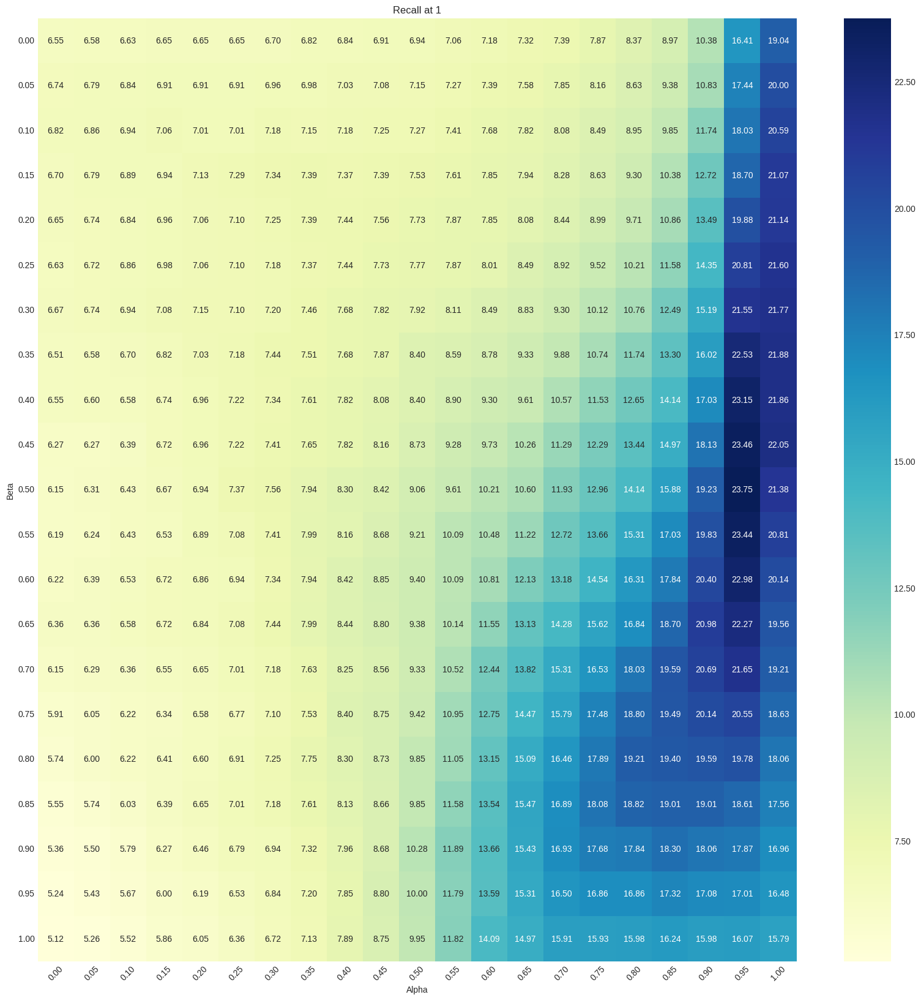

In [12]:
prepare_and_plot_recall_pivot(recall_at1, 'Recall at 1')

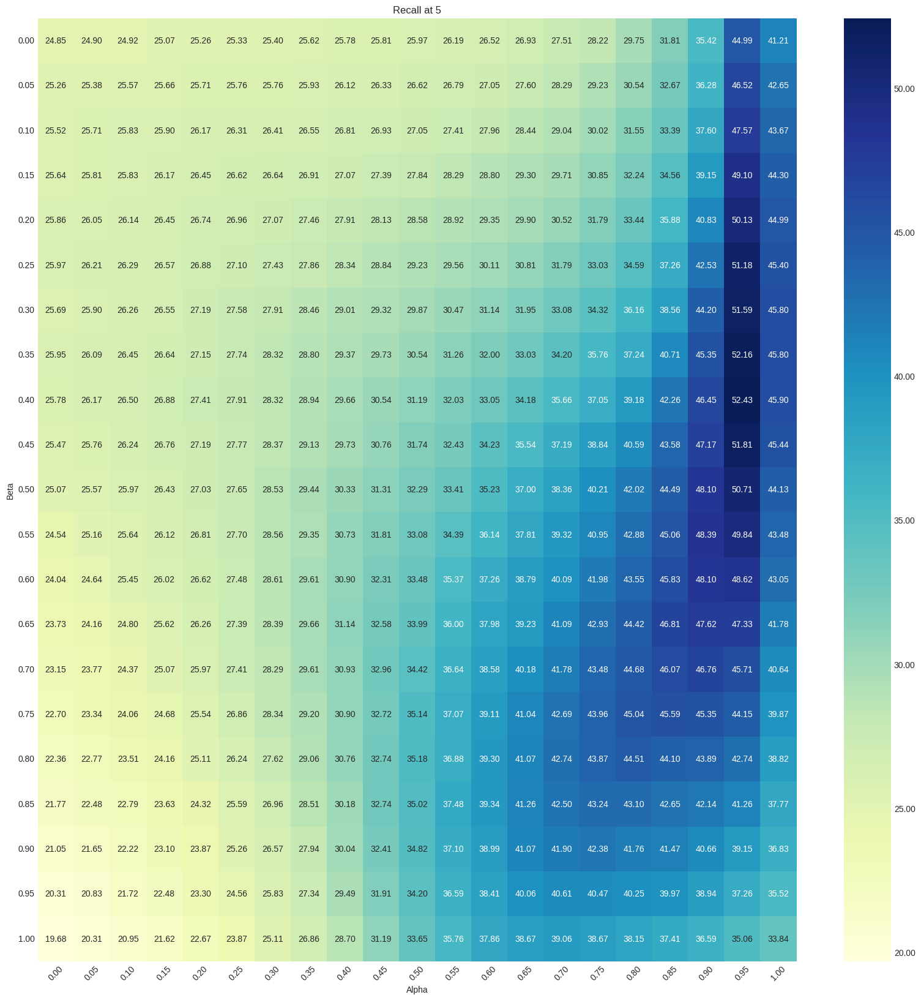

In [13]:
prepare_and_plot_recall_pivot(recall_at5, 'Recall at 5')

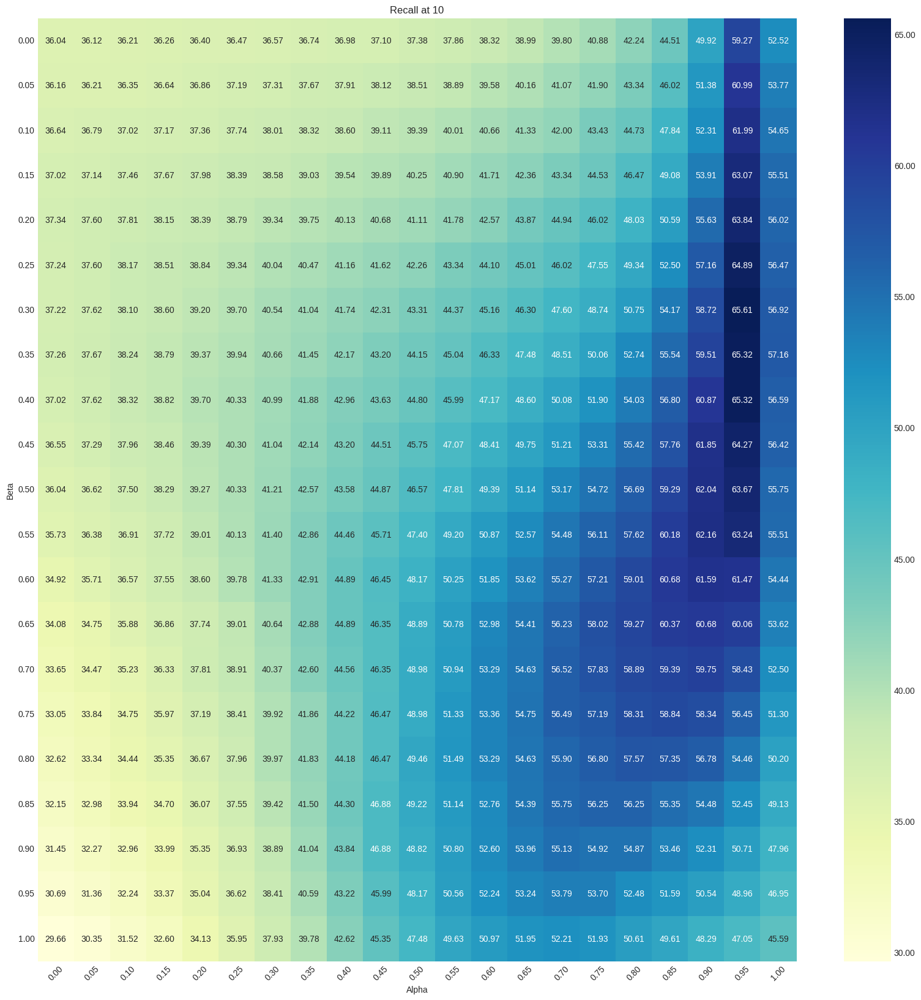

In [14]:
prepare_and_plot_recall_pivot(recall_at10, 'Recall at 10')

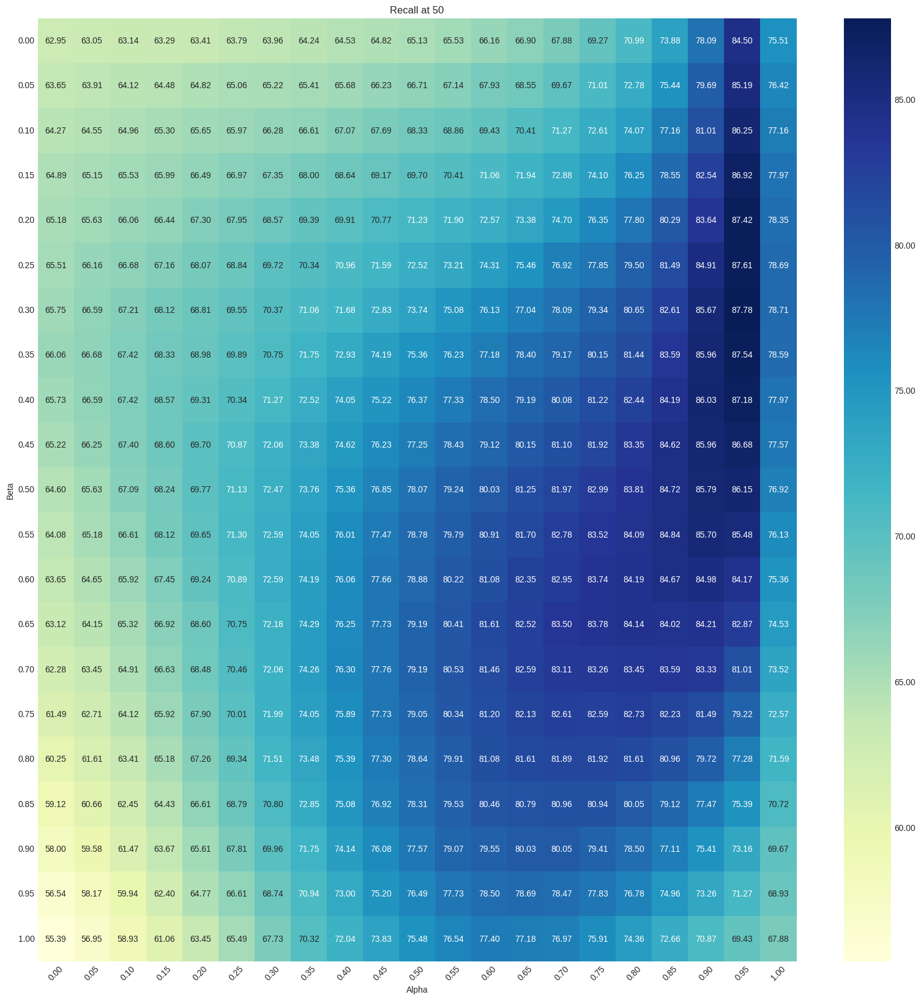

In [15]:
prepare_and_plot_recall_pivot(recall_at50, 'Recall at 50')

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Plot the group recall results</div>

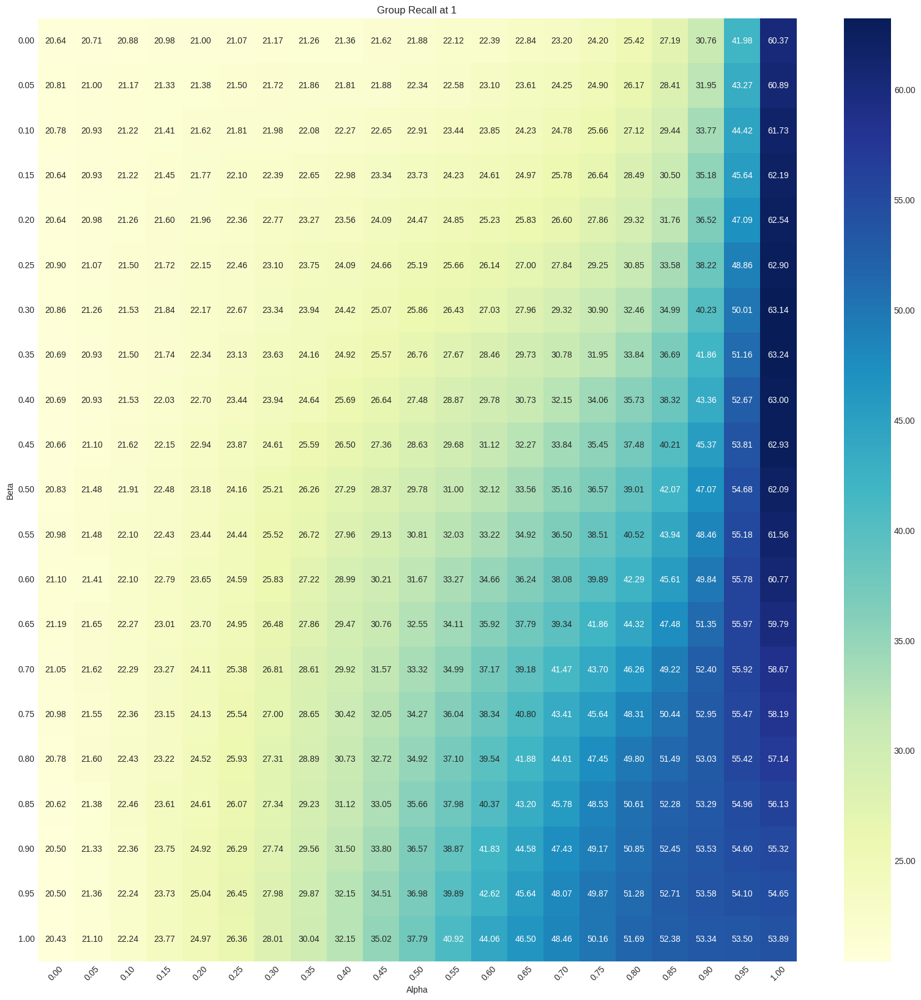

In [16]:
prepare_and_plot_recall_pivot(group_recall_at1, 'Group Recall at 1')

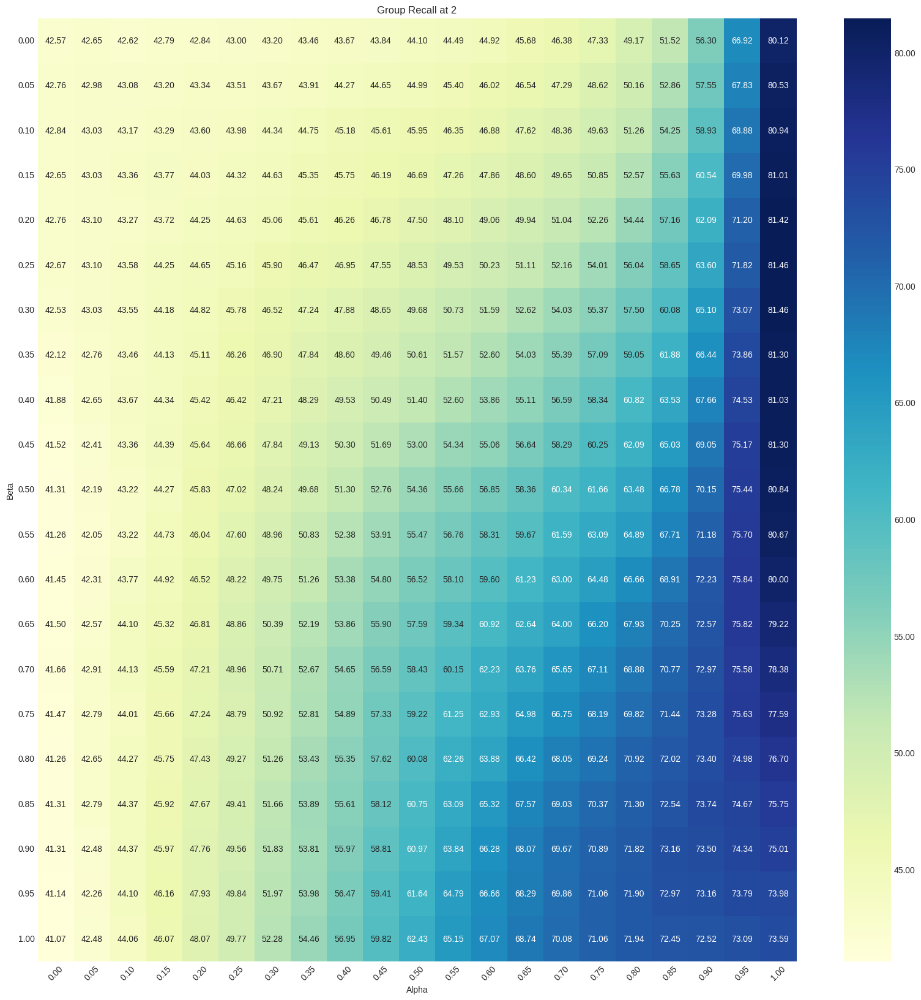

In [17]:
prepare_and_plot_recall_pivot(group_recall_at2, 'Group Recall at 2')

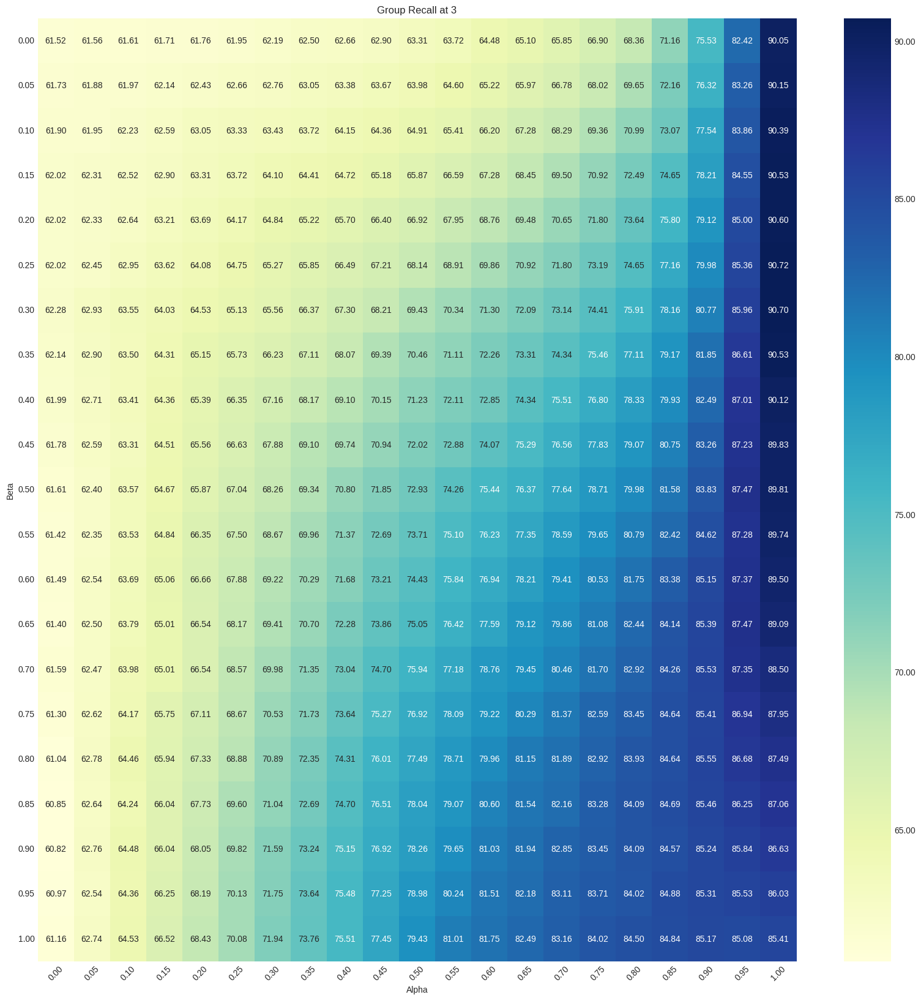

In [18]:
prepare_and_plot_recall_pivot(group_recall_at3, 'Group Recall at 3')

# <div style="font-family: 'Garamond', serif; font-size: 22px; color: #ffffff; background-color: #34568B; text-align: center; padding: 15px; border-radius: 10px; border: 2px solid #FF6F61; box-shadow: 0 6px 12px rgba(0, 0, 0, 0.3); margin-bottom: 20px;">Step 5: View some sample of the result</div>

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Compute the results</div>

In [19]:
sorted_indices, image_index_names, target_names = compute_results_cirr_val(
    get_combing_function_with_alpha(0.95),
    blip_text_encoder,
    blip_img_encoder,
    text_captions,
    preprocess,
    beta=0.2,
    cache=cache,
)

Recall Results
Recall at 1: 19.88
Recall at 5: 50.13
Recall at 10: 63.84
Recall at 50: 87.42
Group Recall Results
Group Recall at 1: 47.09
Group Recall at 2: 71.20
Group Recall at 3: 85.00


## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Prepare the ground truth data</div>

In [20]:
ground_truth = prepare_ground_truths(json.load(open('../../../cirr_dataset/cirr/captions/cap.rc2.val.json')))

DATASET_IMAGE_DIR = '../../../cirr_dataset/dev/'

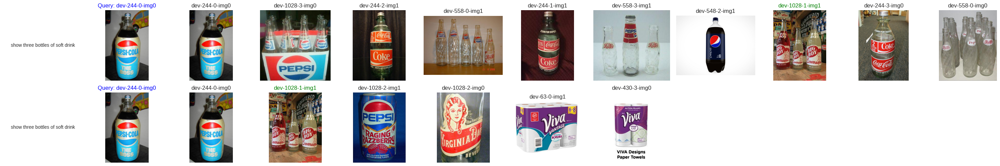

In [21]:
plot_retrieval_results_of_i(
    sorted_indices, 
    image_index_names, 
    target_names, 
    ground_truth, 
    top_k=10, 
    i=0,
    directory=DATASET_IMAGE_DIR,
)

# <div style="font-family: 'Garamond', serif; font-size: 22px; color: #ffffff; background-color: #34568B; text-align: center; padding: 15px; border-radius: 10px; border: 2px solid #FF6F61; box-shadow: 0 6px 12px rgba(0, 0, 0, 0.3); margin-bottom: 20px;">Step 6: Compare with the original without MMLM captions and identical weights element-wise sum</div>

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Compare the results</div>

In [22]:
sorted_indices_origin, image_index_names_origin, target_names_origin = compute_results_cirr_val(
    combining_function_original,
    blip_text_encoder,
    blip_img_encoder,
    text_captions,
    preprocess,
    beta=0,
    cache=cache,
)

Recall Results
Recall at 1: 6.94
Recall at 5: 25.97
Recall at 10: 37.38
Recall at 50: 65.13
Group Recall Results
Group Recall at 1: 21.88
Group Recall at 2: 44.10
Group Recall at 3: 63.31


## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Compare the results</div>

In [23]:
become_better = found_better_than_original(
    sorted_indices_origin, image_index_names_origin, target_names_origin,
    sorted_indices, image_index_names, target_names,
    top_k=10
)

len(become_better), become_better[:10]

(1200, [0, 11, 12, 15, 19, 29, 43, 52, 54, 62])

In [24]:
become_worse = found_better_than_original(
    sorted_indices, image_index_names, target_names,
    sorted_indices_origin, image_index_names_origin, target_names_origin,
    top_k=10
)

len(become_worse), become_worse[:10]

(94, [65, 288, 319, 322, 335, 369, 427, 583, 631, 671])

# <div style="font-family: 'Garamond', serif; font-size: 22px; color: #ffffff; background-color: #34568B; text-align: center; padding: 15px; border-radius: 10px; border: 2px solid #FF6F61; box-shadow: 0 6px 12px rgba(0, 0, 0, 0.3); margin-bottom: 20px;">Step 7: Visualize the comparison</div>

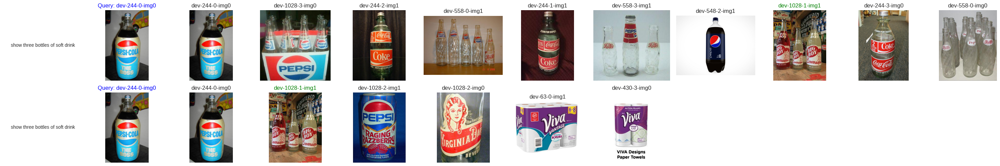

In [25]:
plot_retrieval_results_of_i(sorted_indices, image_index_names, target_names, ground_truth, top_k=10, i=0)

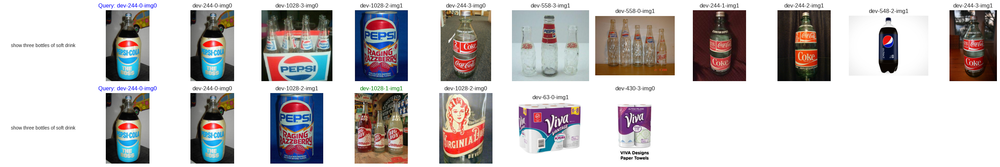

In [26]:
plot_retrieval_results_of_i(sorted_indices_origin, image_index_names_origin, target_names_origin, ground_truth, top_k=10, i=0)

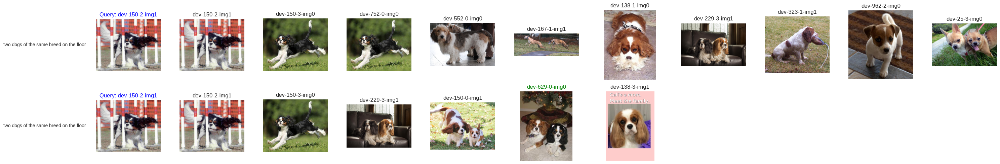

In [27]:
plot_retrieval_results_of_i(sorted_indices, image_index_names, target_names, ground_truth, top_k=10, i=6)

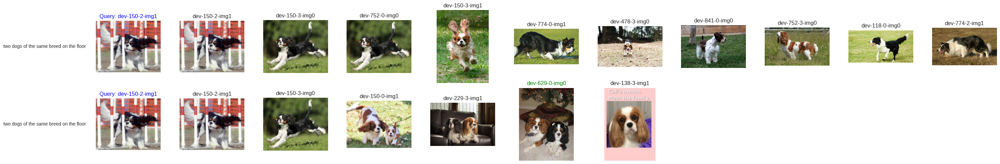

In [28]:
plot_retrieval_results_of_i(sorted_indices_origin, image_index_names_origin, target_names_origin, ground_truth, top_k=10, i=6)

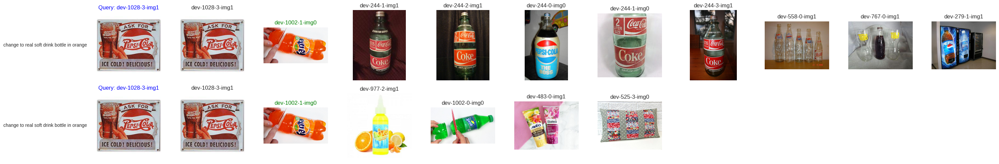

In [29]:
plot_retrieval_results_of_i(sorted_indices, image_index_names, target_names, ground_truth, top_k=10, i=19)

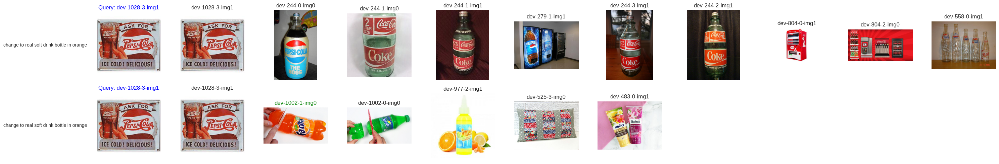

In [30]:
plot_retrieval_results_of_i(sorted_indices_origin, image_index_names_origin, target_names_origin, ground_truth, top_k=10, i=19)